In [2]:
import tempfile
from collections.abc import Callable, Iterable
from pathlib import Path

import kornia.augmentation as K
import matplotlib.pyplot as plt
import numpy as np
import rasterio as rio
import torch
from sklearn.metrics import jaccard_score
from torch.utils.data import DataLoader

from torchgeo.datasets import RasterDataset, stack_samples, unbind_samples, utils
from torchgeo.samplers import RandomGeoSampler, Units
from torchgeo.transforms import indices

## Overview

* Loading a dataset
* Creating a RasterDataset, DataLoaders and Samplers
* Normalising the data
* Spectral indicies
* define a unet model
* loss function and metrics
* training loop

In [2]:
# tmp_path = '~/tmp/surface_water/'
# utils.download_and_extract_archive(
#     'https://hf.co/datasets/cordmaur/earth_surface_water/resolve/main/earth_surface_water.zip',
#     tmp_path,
# )

In [3]:
# from collections.abc import Callable
# from pathlib import Path
# from typing import Optional, Dict

# import matplotlib.pyplot as plt
# from PIL import Image
# from torch import Tensor
# from torchgeo.datasets import NonGeoDataset
# from torchvision.transforms import ToTensor

# class CustomNonGeoDataset(NonGeoDataset):
#     """Custom dataset for semantic segmentation of satellite data.

#     Dataset features:
#     - Images: RGB satellite images in .jpg format.
#     - Masks: Grayscale masks in .png format.
#     - Classes: Binary or multi-class segmentation masks.

#     Dataset format:
#     - Images and masks are stored in separate directories (`images` and `mask`).
#     - Filenames of images and masks match exactly (e.g., `Tile1_00_009.jpg` and `Tile1_00_009.png`).

#     If you use this dataset in your research, please cite the appropriate source.

#     .. versionadded:: 0.1
#     """

#     def __init__(
#         self,
#         root: str = "data",
#         split: str = "train",
#         transforms: Optional[Callable[[Dict[str, Tensor]], Dict[str, Tensor]]] = None,
#         download: bool = False,
#     ) -> None:
#         """Initialize the dataset.

#         Args:
#             root: Root directory where dataset is stored.
#             split: One of "train", "val", or "test".
#             transforms: A function/transform to apply to the input and target.
#             download: If True, download the dataset (not implemented in this example).
#         """
#         super().__init__()
#         root = Path(root)
#         split = split
#         transforms = transforms

#         # Define paths for images and masks
#         image_dir = root / split / "images"
#         mask_dir = root / split / "mask"

#         # List all image and mask files
#         self.image_files = sorted(self.image_dir.glob("*.jpg"))
#         self.mask_files = sorted(self.mask_dir.glob("*.png"))

#         # Ensure that the number of images and masks match
#         assert len(self.image_files) == len(self.mask_files), "Number of images and masks must match."

#     def __len__(self) -> int:
#         """Return the number of samples in the dataset."""
#         return len(self.image_files)

#     def __getitem__(self, index: int) -> Dict[str, Tensor]:
#         """Return a single sample (image and mask) from the dataset.

#         Args:
#             index: Index of the sample to retrieve.

#         Returns:
#             A dictionary containing the image and mask as tensors.
#         """
#         # Load image
#         img_path = self.image_files[index]
#         img = Image.open(img_path).convert("RGB")  # Ensure 3 channels (RGB)

#         # Load mask
#         mask_path = self.mask_files[index]
#         mask = Image.open(mask_path).convert("L")  # Ensure grayscale (1 channel)

#         # Convert to tensors
#         img_tensor = ToTensor()(img)
#         mask_tensor = ToTensor()(mask)

#         # Apply transforms if provided
#         sample = {"image": img_tensor, "mask": mask_tensor}
#         if self.transforms:
#             sample = self.transforms(sample)

#         return sample

#     def plot(self,  index: int) -> plt.Figure:
#         """Plot a sample from the dataset.

#         Args:
#             index: Index of the sample to plot.

#         Returns:
#             A matplotlib figure showing the image and mask.
#         """
#         sample = self[index]
#         img = sample["image"].permute(1, 2, 0).numpy()  # Convert to HWC format
#         mask = sample["mask"].squeeze().numpy()  # Remove channel dimension

#         fig, ax = plt.subplots(1, 2, figsize=(10, 5))
#         ax[0].imshow(img)
#         ax[0].set_title("Image")
#         ax[1].imshow(mask, 
#                      #cmap=cmap
#                      )
#         ax[1].set_title("Mask")
#         plt.tight_layout()

#         return fig

In [4]:
# from collections.abc import Callable
# from pathlib import Path
# from typing import Optional, Dict

# import matplotlib.pyplot as plt
# from PIL import Image
# from torch import Tensor
# from torchgeo.datasets import NonGeoDataset
# from torchvision.transforms import ToTensor

# class CustomNonGeoDataset(NonGeoDataset):
#     """Custom dataset for semantic segmentation of satellite data.

#     Dataset features:
#     - Images: RGB satellite images in .jpg format.
#     - Masks: Grayscale masks in .png format.
#     - Classes: Binary or multi-class segmentation masks.

#     Dataset format:
#     - Images and masks are stored in separate directories (`images` and `mask`).
#     - Filenames of images and masks match exactly (e.g., `Tile1_00_009.jpg` and `Tile1_00_009.png`).

#     If you use this dataset in your research, please cite the appropriate source.

#     .. versionadded:: 0.1
#     """

#     def __init__(
#         self,
#         root: str = "data",
#         split: str = "train",
#         transforms: Optional[Callable[[Dict[str, Tensor]], Dict[str, Tensor]]] = None,
#         download: bool = False,
#     ) -> None:
#         """Initialize the dataset.

#         Args:
#             root: Root directory where dataset is stored.
#             split: One of "train", "val", or "test".
#             transforms: A function/transform to apply to the input and target.
#             download: If True, download the dataset (not implemented in this example).
#         """
#         super().__init__()
#         self.root = Path(root)
#         self.split = split
#         self.transforms = transforms

#         # Define paths for images and masks
#         self.image_dir = self.root / split / "images"
#         self.mask_dir = self.root / split / "mask"

#         # List all image and mask files
#         self.image_files = sorted(self.image_dir.glob("*.jpg"))
#         self.mask_files = sorted(self.mask_dir.glob("*.png"))

#         # Ensure that the number of images and masks match
#         assert len(self.image_files) == len(self.mask_files), "Number of images and masks must match."

#     def __len__(self) -> int:
#         """Return the number of samples in the dataset."""
#         return len(self.image_files)

#     def __getitem__(self, index: int) -> Dict[str, Tensor]:
#         """Return a single sample (image and mask) from the dataset.

#         Args:
#             index: Index of the sample to retrieve.

#         Returns:
#             A dictionary containing the image and mask as tensors.
#         """
#         # Load image
#         img_path = self.image_files[index]
#         img = Image.open(img_path).convert("RGB")  # Ensure 3 channels (RGB)

#         # Load mask
#         # mask_path = self.mask_files[index]
#         # mask = Image.open(mask_path).convert("L")  # Ensure grayscale (1 channel)
#         # Load lables
#         labels_path = self.root / 'labels.npy'
#         dict_load=np.load(labels_path, allow_pickle=True)        
#         if self.split == 'train':
#             labels = dict_load.item()['labels_train']
#         elif self.split == 'val':
#             labels = dict_load.item()['labels_valid']
#         elif self.split == 'test':
#             labels = dict_load.item()['labels_test']
        
        

#         # Convert to tensors
#         img_tensor = ToTensor()(img)
#         # mask_tensor = ToTensor()(mask)
#         labels_tensor = ToTensor()(labels.squeeze()[index])

#         # Apply transforms if provided
#         # sample = {"image": img_tensor, "mask": mask_tensor}
#         sample = {"image": img_tensor, "mask": labels_tensor}
#         if self.transforms:
#             sample = self.transforms(sample)

#         return sample

#     def plot(self,  index: int) -> plt.Figure:
#         """Plot a sample from the dataset.

#         Args:
#             index: Index of the sample to plot.

#         Returns:
#             A matplotlib figure showing the image and mask.
#         """
#         sample = self[index]
#         img = sample["image"].permute(1, 2, 0).numpy()  # Convert to HWC format
#         mask = sample["mask"].squeeze().numpy()  # Remove channel dimension

#         fig, ax = plt.subplots(1, 2, figsize=(10, 5))
#         ax[0].imshow(img)
#         ax[0].set_title("Image")
#         ax[1].imshow(mask, 
#                     #  cmap=cmap
#                      )
#         ax[1].set_title("Mask")
#         plt.tight_layout()

#         return fig

In [3]:
from collections.abc import Callable
from pathlib import Path
from typing import Optional, Dict

import matplotlib.pyplot as plt
from PIL import Image
from torch import Tensor
from torchgeo.datasets import NonGeoDataset
from torchvision.transforms import ToTensor

class CustomNonGeoDataset(NonGeoDataset):
    """Custom dataset for semantic segmentation of satellite data.

    Dataset features:
    - Images: RGB satellite images in .jpg format.
    - Masks: Grayscale masks in .png format.
    - Classes: Binary or multi-class segmentation masks.

    Dataset format:
    - Images and masks are stored in separate directories (`images` and `mask`).
    - Filenames of images and masks match exactly (e.g., `Tile1_00_009.jpg` and `Tile1_00_009.png`).

    If you use this dataset in your research, please cite the appropriate source.

    .. versionadded:: 0.1
    """

    def __init__(
        self,
        root: str = "data",
        split: str = "train",
        transforms: Optional[Callable[[Dict[str, Tensor]], Dict[str, Tensor]]] = None,
        download: bool = False,
    ) -> None:
        """Initialize the dataset.

        Args:
            root: Root directory where dataset is stored.
            split: One of "train", "val", or "test".
            transforms: A function/transform to apply to the input and target.
            download: If True, download the dataset (not implemented in this example).
        """
        super().__init__()
        self.root = Path(root)
        self.split = split
        self.transforms = transforms

        # Define paths for images and masks
        self.image_dir = self.root / split / "images"
        self.mask_dir = self.root / split / "mask"

        # List all image and mask files
        self.image_files = sorted(self.image_dir.glob("*.jpg"))
        self.mask_files = sorted(self.mask_dir.glob("*.png"))

        # Load labels from .npy file
        labels_path = self.root / 'labels.npy'
        if labels_path.exists():
            self.dict_load = np.load(labels_path, allow_pickle=True)
            if self.split == 'train':
                self.labels = self.dict_load.item().get('labels_train', None).squeeze()
            elif self.split == 'valid':
                self.labels = self.dict_load.item().get('labels_valid', None).squeeze()
            elif self.split == 'test':
                self.labels = self.dict_load.item().get('labels_test', None).squeeze()
            
            if self.labels is None:
                raise ValueError(f"Labels for split '{self.split}' not found in {labels_path}")
        else:
            raise FileNotFoundError(f"Labels file not found: {labels_path}")
        
        # Ensure that the number of images and masks match
        assert len(self.image_files) == len(self.mask_files), "Number of images and masks must match."

    def __len__(self) -> int:
        """Return the number of samples in the dataset."""
        return len(self.image_files)

    def __getitem__(self, index: int) -> Dict[str, Tensor]:
        """Return a single sample (image and mask) from the dataset.

        Args:
            index: Index of the sample to retrieve.

        Returns:
            A dictionary containing the image and mask as tensors.
        """
        # Load image
        img_path = self.image_files[index]
        img = Image.open(img_path).convert("RGB")  # Ensure 3 channels (RGB)

        # Load mask
        # mask_path = self.mask_files[index]
        # mask = Image.open(mask_path).convert("L")  # Ensure grayscale (1 channel)
        # Load lables
        # labels_path = self.root / 'labels.npy'
        # dict_load=np.load(labels_path, allow_pickle=True)        
        # if self.split == 'train':
        #     labels = dict_load.item()['labels_train']
        # elif self.split == 'val':
        #     labels = dict_load.item()['labels_valid']
        # elif self.split == 'test':
        #     labels = dict_load.item()['labels_test']
        
        

        # Convert to tensors
        img_tensor = ToTensor()(img)
        # print(f"image tensor shape: {img_tensor.shape}")  # Debug print
        
        # mask_tensor = ToTensor()(mask)
        # print(f"Labels: {self.labels}")  # Debug print
        # print(f"Labels: {self.labels.shape}")  # Debug print
        labels_tensor = torch.from_numpy(self.labels[index]).squeeze().long() # Convert to long tensor (e.g. float32 -> int64)
        # print(f"Labels tensor shape: {labels_tensor.shape}")

        # Apply transforms if provided
        # sample = {"image": img_tensor, "mask": mask_tensor}
        sample = {"image": img_tensor, "mask": labels_tensor}
        if self.transforms:
            sample = self.transforms(sample)

        return sample

    def plot(self,  index: int) -> plt.Figure:
        """Plot a sample from the dataset.

        Args:
            index: Index of the sample to plot.

        Returns:
            A matplotlib figure showing the image and mask.
        """
        sample = self[index]
        img = sample["image"].permute(1, 2, 0).numpy()  # Convert to HWC format
        mask = sample["mask"].squeeze().numpy()  # Remove channel dimension

        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(img)
        ax[0].set_title("Image")
        ax[1].imshow(mask, 
                     vmin=1, 
                     vmax=6
                    #  cmap=cmap
                     )
        ax[1].set_title("Mask")
        plt.tight_layout()

        return fig

torch.Size([3, 256, 256]) torch.Size([256, 256])


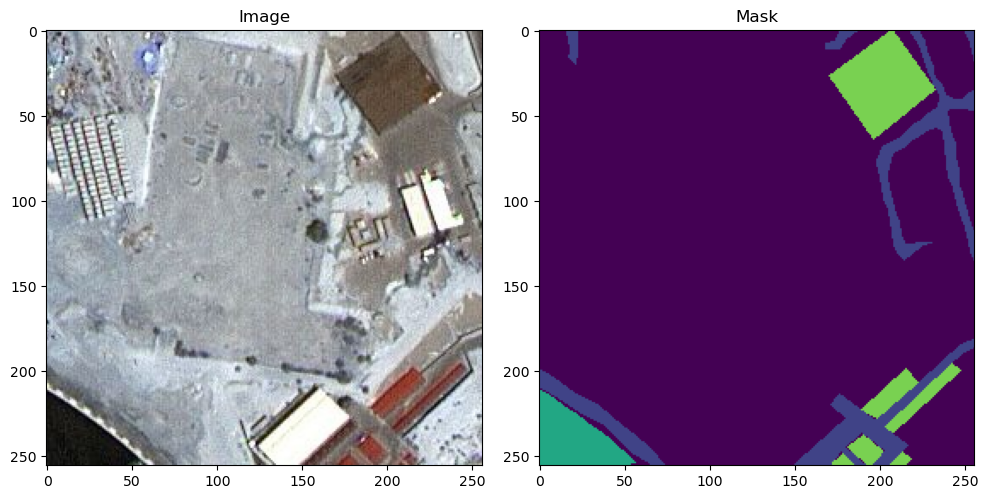

In [6]:
# Define the dataset
dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="valid")

# Access a sample
sample = dataset[20]
print(sample["image"].shape, sample["mask"].shape)  # Should print torch.Size([3, H, W]) and torch.Size([1, H, W])

# Plot a sample
fig = dataset.plot(20)
plt.show()

# Create a DataLoader
from torch.utils.data import DataLoader

dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [7]:
def scale(item: dict):
    item['image'] = item['image'] / 10000
    return item

## Dataloaders

In [4]:
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor, Resize

# Define transforms (optional)
# For example, resize images and masks to 512x512 and convert them to tensors
transforms = Compose([
    # Resize((512, 512)),  # Resize images and masks to 512x512
    # ToTensor(),           # Convert images and masks to PyTorch tensors
])

# Create datasets
train_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="train", transforms=transforms)
val_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="valid", transforms=transforms)
test_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="test", transforms=transforms)

# Define batch size
batch_size = 8  # Adjust as needed

# Create DataLoaders
train_dataloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,  # Shuffle the training data
    num_workers=4,  # Number of subprocesses for data loading
    pin_memory=True,  # Speed up data transfer to GPU
)

val_dataloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,  # Do not shuffle validation data
    num_workers=4,  # Number of subprocesses for data loading
    pin_memory=True,  # Speed up data transfer to GPU
)

test_dataloader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,  # Do not shuffle test data
    num_workers=4,  # Number of subprocesses for data loading
    pin_memory=True,  # Speed up data transfer to GPU
)


# Print details
print(f"Training DataLoader: {len(train_dataloader)} batches of size {batch_size}")
print(f"Validation DataLoader: {len(val_dataloader)} batches of size {batch_size}")
print(f"Test DataLoader: {len(test_dataloader)} batches of size {batch_size}")


Training DataLoader: 98 batches of size 8
Validation DataLoader: 33 batches of size 8
Test DataLoader: 33 batches of size 8


## Visualise Batch

In [ ]:
batch = next(iter(dataloader))


In [31]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
from matplotlib import colors as mcolors

# Define the colormap
class_names = ['Building', 'Road', 'Land', 'Vegetation', 'Water', 'Unlabeled']
cmap = mcolors.ListedColormap([
    '#3C1098',  # Building
    '#8429F6',  # Road
    '#6EC1E4',  # Land (unpaved area)
    '#FEDD3A',  # Vegetation
    '#E2A929',  # Water
    '#9B9B9B'   # Unlabeled
])

# Function to visualize a specific batch of images and masks
def visualize_batch(dataloader, batch_idx=0):
    """
    Visualize a specific batch of images and masks from a dataloader.

    Args:
        dataloader (DataLoader): The dataloader containing the dataset.
        batch_idx (int): The index of the batch to visualize.
    """
    # Iterate through the dataloader to the specified batch
    for i, batch in enumerate(dataloader):
        if i == batch_idx:
            images = batch['image']
            masks = batch['mask']
            break
    else:
        raise ValueError(f"Batch index {batch_idx} is out of range for the dataloader.")

    # Plot the images and masks
    batch_size = images.size(0)
    fig, axes = plt.subplots(batch_size, 2, figsize=(10, batch_size * 5))
    
    for i in range(batch_size):
        img = F.to_pil_image(images[i])
        
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(masks[i], 
                          cmap=cmap,
                          vmin=1,
                          vmax=5
                          )
        axes[i, 1].set_title("Mask")
        axes[i, 1].axis("off")
        
        # Add legend
        legend_handles = [plt.Rectangle((0, 0), 1, 1, color=cmap(i)) for i in range(len(class_names))]
        axes[i, 1].legend(legend_handles, legend_labels, loc='upper right')
    
    plt.tight_layout()
    plt.show()

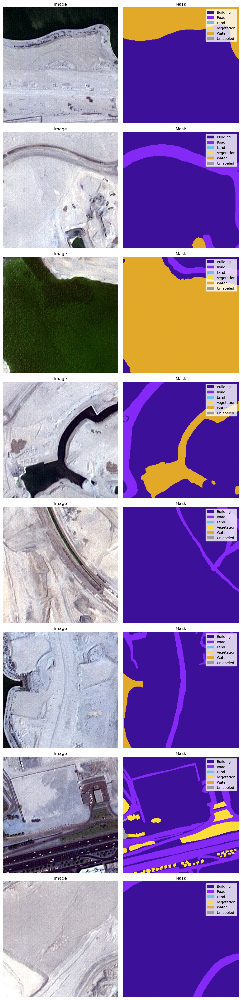

In [28]:
visualize_batch(val_dataloader)


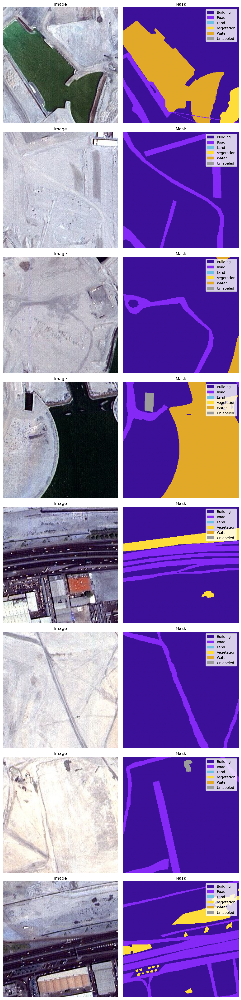

In [29]:
visualize_batch(test_dataloader)


In [9]:
# import matplotlib.colors as mcolors
# import matplotlib.pyplot as plt

# # Define the colormap
# cmap = mcolors.ListedColormap([
#     '#3C1098',  # Building
#     '#8429F6',  # Land (unpaved area)
#     '#6EC1E4',  # Road
#     '#FEDD3A',  # Vegetation
#     '#E2A929',  # Water
#     '#9B9B9B'   # Unlabeled
# ])

# # Create a colorbar legend
# norm = mcolors.BoundaryNorm(boundaries=[0, 1, 2, 3, 4, 5, 6], ncolors=cmap.N)
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array([])  # Set an empty array to avoid error
# cbar = plt.colorbar(sm, ticks=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
# cbar.set_ticklabels(['Building', 'Land', 'Road', 'Vegetation', 'Water', 'Unlabeled'])
# cbar.set_label('Class')

# plt.show()


### Define the model: U-Net based model

The model we defined consists of a contracting path and an expansive path. 
*   The contracting path follows the typical architecture of a convolutional network. It consists of the repeated application of two 3x3 convolutions, each followed by a rectified linear unit (ReLU) and a 2x2 max pooling operation with stride 2 for downsampling. 
*   At each downsampling step we double the number of feature channels. Every step in the expansive path consists of an upsampling of the feature map followed by a 2x2 convolution (“up-convolution”) that halves the number of feature channels, a concatenation with the correspondingly cropped feature map from the contracting path, and two 3x3 convolutions, each followed by a ReLU. 

At the final layer, a 1x1 convolution is used to map each 64-component feature vector to the desired number of classes. 

Layers used: 

1.   **Conv2D** 
```
tf.keras.layers.Conv2D(filters, kernel_size, strides=(1, 1), padding="valid", data_format=None, dilation_rate=(1, 1), groups=1, activation=None, use_bias=True, kernel_initializer="glorot_uniform", bias_initializer="zeros", kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None, **kwargs)
```



2.   **MaxPooling2D**
```
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=None, padding="valid", data_format=None, **kwargs)
```

3.  **UpSampling2D**
```
tf.keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation="nearest", **kwargs)
```
*   interpolation:	A string, one of 'nearest' or 'bilinear'.








## Segmentation Model

For the semantic segmentation model, we are going to use a predefined architecture that is available in Pytorch. Looking at list (https://pytorch.org/vision/stable/models.html#semantic-segmentation) it is possible to note 3 models available for semantic segmentation, but one (LRASPP) is intended for mobile applications. In our tutorial, we will use the DeepLabV3 model.

Here, we will create a DeepLabV3 model for 2 classes. In this case, I will skip the pretrained weights, as the weights represent another domain (not water segmentation from multispectral imagery).

In [17]:
# from torchvision.models.segmentation import deeplabv3_resnet50

# model = deeplabv3_resnet50(weights=None, num_classes=6)
# model

In [34]:
# import pytorch_lightning as pl
from torchgeo.trainers import SemanticSegmentationTask

# Define the task
task = SemanticSegmentationTask(
    loss='ce',  # Cross-entropy loss
    model='unet',  # U-Net model
    in_channels=3,  # Input channels (e.g., RGB images)
    num_classes=6,  # Number of output classes
    lr=0.001,  # Learning rate
    patience=10,  # Patience for early stopping
)

The first thing we have to pay attention in the model architecture is the number of channels expected in the first convolution (Conv2d), that is defined as 3. That’s because the model is prepared to work with RGB images. After the first convolution, the 3 channels will produce 64 channels in lower resolution, and so on. As we have now 9 channels, we will change this first processing layer to adapt correctly to our model. We can do this by replacing the first convolutional layer for a new one, by following the commands. Finally, we check a mock batch can pass through the model and provide the output with 2 channels (water / no_water) as desired.

In [19]:
# backbone = model.get_submodule('backbone')

# conv = torch.nn.modules.conv.Conv2d(
#     in_channels=3,
#     out_channels=64,
#     kernel_size=(7, 7),
#     stride=(2, 2),
#     padding=(3, 3),
#     bias=False,
# )
# backbone.register_module('conv1', conv)

# pred = model(torch.randn(3, 9, 512, 512))
# pred['out'].shape

## Training Loop

The training function should receive the number of epochs, the model, the dataloaders, the loss function (to be optimized) the accuracy function (to assess the results), the optimizer (that will adjust the parameters of the model in the correct direction) and the transformations to be applied to each batch.

In [20]:
%matplotlib inline
%load_ext tensorboard

import os
import tempfile

import torch
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger

# from torchgeo.datamodules import EuroSAT100DataModule
# from torchgeo.models import ResNet18_Weights
# from torchgeo.trainers import ClassificationTask

In [21]:
# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [22]:
batch_size = 8
num_workers = 2
max_epochs = 50
fast_dev_run = False

In [23]:
accelerator = 'gpu' if torch.cuda.is_available() else 'cpu'
default_root_dir = os.path.join('./', 'experiments')
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss', dirpath=default_root_dir, save_top_k=1, save_last=True
)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10)
logger = TensorBoardLogger(save_dir=default_root_dir, name='tutorial_logs')

In [28]:
def training_step(self, batch, batch_idx):
    x, y = batch
    y_hat = self(x)
    loss = self.loss_fn(y_hat, y)
    accuracy = (y_hat.argmax(dim=1) == y).float().mean()

    # Log loss and accuracy
    self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
    self.log('train_acc', accuracy, on_step=True, on_epoch=True, prog_bar=True)

    return loss

In [29]:
trainer = Trainer(
    accelerator=accelerator,
    callbacks=[checkpoint_callback, early_stopping_callback, ],
    # fast_dev_run=fast_dev_run,
    log_every_n_steps=1,
    logger=logger,
    min_epochs=1,
    max_epochs=max_epochs,
    # enable_checkpointing=True,
    # enable_early_stopping=True,
    # check_val_every_n_epoch=1

)

/exports/csce/datastore/geos/users/s2112771/miniforge3/envs/sensebook/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /exports/csce/datastore/geos/users/s2112771/miniforg ...
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [30]:
# history = 
trainer.fit(model=task, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

/exports/csce/datastore/geos/users/s2112771/miniforge3/envs/sensebook/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /exports/csce/datastore/geos/users/s2112771/sense_cpd/sense_book/book/3_ml4eo/3_sat_ml_deep/experiments exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.5 M | train
1 | criterion     | CrossEntropyLoss | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollection | 0      | train
4 | test_metrics  | MetricCollection | 0      | train
-----------------------------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.087   Total estimated model par

Epoch 38: 100%|██████████| 98/98 [00:11<00:00,  8.57it/s, v_num=2]         


In [31]:
# test_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="test", transforms=transforms)
# test_dataloader = DataLoader(
#     test_dataset,
#     batch_size=batch_size,
#     shuffle=False,  # Do not shuffle test data
#     num_workers=num_workers,  # Number of subprocesses for data loading
#     pin_memory=True,  # Speed up data transfer to GPU
# )

In [32]:
trainer.test(model=task, dataloaders=test_dataloader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████| 33/33 [00:00<00:00, 47.59it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.8341513276100159
test_MulticlassJaccardIndex    0.7154885530471802
         test_loss             0.4819890260696411
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4819890260696411,
  'test_MulticlassAccuracy': 0.8341513276100159,
  'test_MulticlassJaccardIndex': 0.7154885530471802}]

## Visualise results

In [38]:
# Load the model from the checkpoint
task = SemanticSegmentationTask.load_from_checkpoint('./experiments/last-v2.ckpt', )
task.eval()

In [57]:
task.eval()  # Disable dropout and batch normalization
task.freeze()  # Freeze the model for inference

# Initialize lists to store predictions and ground truth masks
all_preds = []
all_masks = []

with torch.no_grad():
    # Get a batch of test data
    batch = next(iter(test_dataloader))
    images = batch['image'].to('cuda')
    masks = batch['mask'].to('cuda')
    
    # Make predictions
    predictions = task(images)
    # Convert predictions to masks
    predicted_masks = torch.argmax(predictions, dim=1)

    # Store predictions and ground truth masks
    all_preds.append(predictions.cpu())  # Move predictions to CPU
    all_masks.append(masks.cpu())  # Move masks to CPU

# Concatenate predictions and ground truth masks
all_preds = torch.cat(all_preds)
all_masks = torch.cat(all_masks)

In [73]:
# Function to visualize a batch of images and masks
def visualize_batch(dataloader, predicted_masks):
    # Get a batch of training data
    batch = next(iter(dataloader))
    images = batch['image'].cpu()
    masks = batch['mask'].cpu()
    
    # Plot the images and masks
    batch_size = images.size(0)
    fig, axes = plt.subplots(batch_size, 3, figsize=(15, batch_size * 5))
    
    for i in range(batch_size):
        img = F.to_pil_image(images[i])
        mask = masks[i]
        predicted_mask = predicted_masks[i].cpu()
        
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(mask, cmap=cmap, vmin=1, vmax=5)
        axes[i, 1].set_title("Mask")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(predicted_mask, cmap=cmap, vmin=1, vmax=5)
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis("off")
    
        # Add legend
        # legend_labels = ['Building', 'Land', 'Road', 'Vegetation', 'Water', 'Unlabeled']
        # legend_labels = ['Water', 'Land (unpaved area)', 'Road', 'Building', 'Vegetation', 'Unlabelled']
        legend_handles = [plt.Rectangle((0, 0), 1, 1, color=cmap(i)) for i in range(len(class_names))]
        axes[i, 2].legend(legend_handles, class_names)
    
    plt.tight_layout()
    plt.show()

In [59]:
from torchmetrics import ConfusionMatrix

# Define the number of classes
num_classes = 6  # Adjust based on your dataset

# Initialize the confusion matrix
conf_matrix = ConfusionMatrix(task="multiclass", num_classes=num_classes)

# Compute the confusion matrix
conf_matrix.update(all_preds, all_masks)
conf_matrix = conf_matrix.compute()

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_confusion_matrix(conf_matrix, class_names, normalize=False, cmap='Blues'):
    """
    Plot a confusion matrix.

    Args:
        conf_matrix (torch.Tensor or numpy.ndarray): Confusion matrix.
        class_names (list): List of class names.
        normalize (bool): Whether to normalize the confusion matrix.
    """
    if isinstance(conf_matrix, torch.Tensor):
        conf_matrix = conf_matrix.cpu().numpy()

    if normalize:
        conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='.2f' if normalize else 'd', cmap=cmap,
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Normalized Confusion Matrix' if normalize else 'Confusion Matrix')
    plt.show()



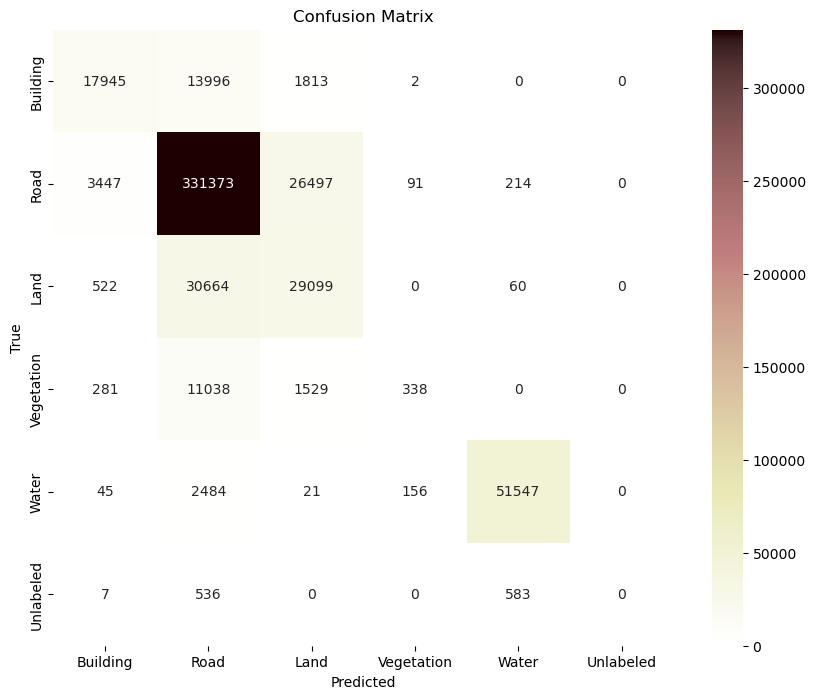

In [62]:
# Plot the normalized confusion matrix
plot_confusion_matrix(conf_matrix, class_names, cmap='pink_r')


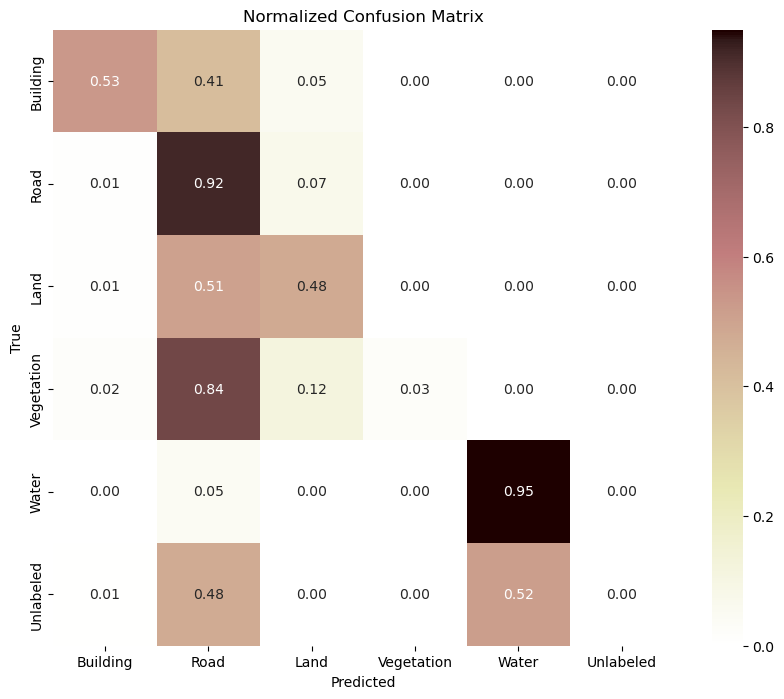

In [60]:
# Plot the normalized confusion matrix
plot_confusion_matrix(conf_matrix, class_names, normalize=True, cmap='pink_r')
# plot_confusion_matrix(conf_matrix, class_names, normalize=True, cmap='bone_r')

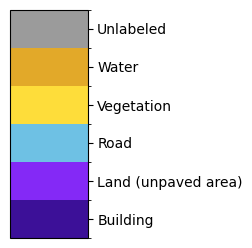

In [129]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Define the colormap
cmap = mcolors.ListedColormap([
    '#3C1098',  # Building
    '#8429F6',  # Land (unpaved area)
    '#6EC1E4',  # Road
    '#FEDD3A',  # Vegetation
    '#E2A929',  # Water
    '#9B9B9B'   # Unlabeled
])

# Define the labels for each color
labels = ['Building', 'Land (unpaved area)', 'Road', 'Vegetation', 'Water', 'Unlabeled']

# Create a figure and axis
fig, ax = plt.subplots(figsize=(1, 6))
fig.subplots_adjust(bottom=0.5)

# Create a colorbar
bounds = np.arange(len(labels) + 1)  # Define boundaries for each color
norm = mcolors.BoundaryNorm(bounds, cmap.N)
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                  cax=ax, orientation='vertical', ticks=bounds[:-1] + 0.5)
cb.set_ticklabels(labels)  # Set the labels for the colorbar

# Display the colorbar
plt.show()

In [135]:
# def train_loop(
#     epochs: int,
#     train_dl: DataLoader,
#     val_dl: DataLoader | None,
#     model: torch.nn.Module,
#     loss_fn: Callable,
#     optimizer: torch.optim.Optimizer,
#     acc_fns: list | None = None,
#     batch_tfms: Callable | None = None,
#     ):
#     # size = len(dataloader.dataset)
#     cuda_model = model.to(device)

#     for epoch in range(epochs):
#         accum_loss = 0
#         for batch in train_dl:
#             if batch_tfms is not None:
#                 X = batch_tfms(batch['image']).to(device)
#             else:
#                 X = batch['image'].to(device)

#             y = batch['mask'].type(torch.long).to(device)
#             pred = cuda_model(X)['out']
#             loss = loss_fn(pred, y)

#             # BackProp
#             optimizer.zero_grad()
#             loss.backward()
#             optimizer.step()

#             # update the accum loss
#             accum_loss += float(loss) / len(train_dl)

#         # Testing against the validation dataset
#         if acc_fns is not None and val_dl is not None:
#             # reset the accuracies metrics
#             acc = [0.0] * len(acc_fns)

#             with torch.no_grad():
#                 for batch in val_dl:
#                     if batch_tfms is not None:
#                         X = batch_tfms(batch['image']).to(device)
#                     else:
#                         X = batch['image'].type(torch.float32).to(device)

#                     y = batch['mask'].type(torch.long).to(device)

#                     pred = cuda_model(X)['out']

#                     for i, acc_fn in enumerate(acc_fns):
#                         acc[i] = float(acc[i] + acc_fn(pred, y) / len(val_dl))

#             # at the end of the epoch, print the errors, etc.
#             print(
#                 f'Epoch {epoch}: Train Loss={accum_loss:.5f} - Accs={[round(a, 3) for a in acc]}'
#             )
#         else:
#             print(f'Epoch {epoch}: Train Loss={accum_loss:.5f}')

## Loss and Accuracy Functions

For the loss function, normally the Cross Entropy Loss should work, but it requires the mask to have shape (N, d1, d2). In this case, we will need to squeeze our second dimension manually.

In [75]:
# def oa(pred, y):
#     flat_y = y.squeeze()
#     flat_pred = pred.argmax(dim=1)
#     acc = torch.count_nonzero(flat_y == flat_pred) / torch.numel(flat_y)
#     return acc

# def iou(pred, y):
#     flat_y = y.cpu().numpy().squeeze()
#     flat_pred = pred.argmax(dim=1).detach().cpu().numpy()
#     return jaccard_score(flat_y.reshape(-1), flat_pred.reshape(-1), average='macro', zero_division=1.0)

# def loss(p, t):
#     return torch.nn.functional.cross_entropy(p, t.squeeze())

## Training

> To train the model it is important to have CUDA GPUs available. In Colab, it can be done by changing the runtime type and re-running the notebook.

In [76]:
# # adjust number of epochs depending on the device
# if torch.cuda.is_available():
#     num_epochs = 2
# else:
#     # if GPU is not available, just make 1 pass and limit the size of the datasets
#     num_epochs = 1

#     # by limiting the length of the sampler we limit the iterations in each epoch
#     train_dataloader.sampler.length = 8
#     val_dataloader.sampler.length = 8

# # train the model
# optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=0.01)
# train_loop(
#     num_epochs,
#     train_dataloader,
#     val_dataloader,
#     model,
#     loss,
#     optimizer,
#     acc_fns=[oa, iou],
#     # batch_tfms=tfms,
# )

## Exercises


### Exercise 1: Finetune the segmentation model 

Now try adjusting the model by implementing different methods of reducing overfitting and increasing the model's ability to generalise.

1. Retrain the model by using or adding a different loss function and see what happens to the performance of the segmentation model. The segmentation models losses can be combined together by '+' and scaled by integer or float factor set class weights for dice_loss.
E.g., add in a **categorical_crossentropy** or **CategoricalFocalLoss** loss in the Configure the model for training section.

 >Hint: Further details for loss options can be found in [segmentation losses](https://segmentation-models.readthedocs.io/en/latest/api.html?highlight=loss#losses)








 














## Exercise 2: Try another model architecture
Change the network architecture to U-net with Resnet backbone. Use pretrainded weights to initialize it.

> Hint: To do this, follow the instructions in [Segmentation Models Python API](https://segmentation-models.readthedocs.io/en/latest/tutorial.html?highlight=loss#simple-training-pipeline), and you can implete U-net with pretrained weights in simple two lines. It provides 4 models architectures for binary and multi class segmentation (including legendary Unet) and 25 available backbones for each architecture.  All backbones have pre-trained weights for faster and better convergence.

